import data

In [21]:
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

sessions = pd.read_csv('charging_sessions.csv', skipinitialspace=True)
stations = pd.read_csv('charging_stations.csv', skipinitialspace=True)
customers = pd.read_csv('customers.csv', skipinitialspace=True)
districts = pd.read_csv('districts.csv', skipinitialspace=True)




initial exploration

In [22]:
print(districts.columns)
print(districts.shape)
districts.head()
districts.info()
print(districts.describe())

Index(['district_name', 'income_tier', 'projected_evs', 'projected_plugs',
       'projected_regular_customers'],
      dtype='object')
(18, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   district_name                18 non-null     object
 1   income_tier                  18 non-null     object
 2   projected_evs                18 non-null     int64 
 3   projected_plugs              18 non-null     int64 
 4   projected_regular_customers  18 non-null     int64 
dtypes: int64(3), object(2)
memory usage: 852.0+ bytes
       projected_evs  projected_plugs  projected_regular_customers
count      18.000000        18.000000                    18.000000
mean     1944.444444        58.944444                   388.888889
std       920.500006        28.032486                   184.100001
min       600.000000        18.0

In [45]:
# Create a heatmap of Warsaw using income_tier from charging_stations.csv
# First, install folium if needed: !pip install folium

try:
    import folium
    from folium.plugins import HeatMap
    FOLIUM_AVAILABLE = True
except ImportError:
    print("Folium is not installed. Installing now...")
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "folium"])
    import folium
    from folium.plugins import HeatMap
    FOLIUM_AVAILABLE = True

# Create a color mapping for income tiers
income_tier_colors = {
    'High': 'green',
    'Mid-Range': 'orange', 
    'Low-Mid': 'red'
}

# Create a base map centered on Warsaw
# Warsaw center coordinates: 52.2297° N, 21.0122° E
warsaw_map = folium.Map(
    location=[52.2297, 21.0122], 
    zoom_start=11,
    tiles='OpenStreetMap'  # You can also use 'CartoDB positron' or 'Stamen Terrain'
)

# Prepare data for heatmap - create weighted points based on income tier
heat_data = []
for idx, row in stations.iterrows():
    # Weight: High=3, Mid-Range=2, Low-Mid=1
    weight_map = {'High': 3, 'Mid-Range': 2, 'Low-Mid': 1}
    weight = weight_map.get(row['income_tier'], 1)
    heat_data.append([row['latitude'], row['longitude'], weight])

# Add heatmap layer
HeatMap(
    heat_data, 
    min_opacity=0.3, 
    max_zoom=18, 
    radius=20, 
    blur=15, 
    gradient={
        0.0: 'blue',    # Low-Mid
        0.5: 'orange',  # Mid-Range  
        1.0: 'green'    # High
    }
).add_to(warsaw_map)

# Add markers for each station with color coding
for idx, row in stations.iterrows():
    color = income_tier_colors.get(row['income_tier'], 'gray')
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=8,
        popup=folium.Popup(
            f"<b>Station {row['station_id']}</b><br>"
            f"District: {row['district_name']}<br>"
            f"Income Tier: {row['income_tier']}<br>"
            f"Operator: {row['operator_name']}",
            max_width=200
        ),
        tooltip=f"Station {row['station_id']} - {row['district_name']}",
        color='black',
        fill=True,
        fillColor=color,
        fillOpacity=0.7,
        weight=2
    ).add_to(warsaw_map)

# Add legend
legend_html = '''
<div style="position: fixed; 
     bottom: 50px; right: 50px; width: 200px; height: 140px; 
     background-color: white; border:2px solid grey; z-index:9999; 
     font-size:14px; padding: 10px; border-radius: 5px; box-shadow: 0 0 15px rgba(0,0,0,0.2);">
     <p style="margin: 0 0 10px 0; font-weight: bold; font-size: 16px;">Income Tier</p>
     <p style="margin: 5px 0;"><span style="color:green; font-size: 20px;">●</span> High</p>
     <p style="margin: 5px 0;"><span style="color:orange; font-size: 20px;">●</span> Mid-Range</p>
     <p style="margin: 5px 0;"><span style="color:red; font-size: 20px;">●</span> Low-Mid</p>
</div>
'''
warsaw_map.get_root().html.add_child(folium.Element(legend_html))

# Display the map
warsaw_map

# Print summary statistics
print("\nSummary by Income Tier:")
print(stations.groupby('income_tier').size())
print(f"\nTotal stations: {len(stations)}")



Summary by Income Tier:
income_tier
High         13
Low-Mid      22
Mid-Range    30
dtype: int64

Total stations: 65


identifying unknown values

In [24]:
print(sessions['customer_id'].value_counts(dropna=False))

customer_id
C1537    32
C5499    30
C4803    30
C1113    29
C3387    28
C2158    28
C1560    28
C4881    28
C7395    28
C3586    28
C2965    28
C4276    28
C7673    28
C7081    27
C3125    27
C6078    27
C4003    27
C5033    27
C5878    27
C2591    27
C2721    27
C4179    27
C6385    27
C2463    27
C3092    27
C2233    27
C5490    27
C3723    26
C6497    26
C4685    26
C0729    26
C0982    26
C3361    26
C5229    26
C4481    26
C5188    26
C6574    26
C4312    26
C0824    26
C0872    26
C3254    26
C4093    26
C4161    26
C3923    25
C1838    25
C1203    25
C5410    25
C6272    25
C6923    25
C4609    25
C5680    25
C0132    25
C4364    25
C5103    25
C1753    25
C6857    25
C1302    25
C4081    25
C3206    25
C7018    25
C3124    25
C2744    25
C2906    25
C2500    25
C2057    25
C5683    25
C2205    25
C2374    25
C5983    25
C1497    25
C0406    25
C7933    24
C3469    24
C5548    24
C2834    24
C0926    24
C7302    24
C2623    24
C1334    24
C5337    24
C5841    24
C2116    24
C745

cleaning up data

In [25]:
# replacing missing values with 'Unknown'
sessions.fillna('Unknown', inplace=True)
stations.fillna('Unknown', inplace=True)
customers.fillna('Unknown', inplace=True)
districts.fillna('Unknown', inplace=True)

print(sessions.isna().sum())
print(stations.isna().sum())
print(customers.isna().sum())
print(districts.isna().sum())


session_id            0
customer_id           0
station_id            0
session_start_time    0
kwh_charged           0
cost_per_kwh          0
total_cost            0
dtype: int64
station_id       0
district_name    0
income_tier      0
operator_name    0
plugs_count      0
latitude         0
longitude        0
dtype: int64
customer_id             0
income_tier             0
car_model               0
battery_capacity_kwh    0
dtype: int64
district_name                  0
income_tier                    0
projected_evs                  0
projected_plugs                0
projected_regular_customers    0
dtype: int64


categorical/binary columns

In [26]:
#finding any weird category values
for col in sessions.select_dtypes(include='object').columns:
    print(f"Column: {col}")
    print(sessions[col].value_counts())
    print()

#finding any weird category values


Column: session_id
session_id
S00001     1
S75998     1
S76009     1
S76008     1
S76007     1
S76006     1
S76005     1
S76004     1
S76003     1
S76002     1
S76001     1
S76000     1
S75999     1
S75997     1
S76011     1
S75996     1
S75995     1
S75994     1
S75993     1
S75992     1
S75991     1
S75990     1
S75989     1
S75988     1
S75987     1
S75986     1
S76010     1
S76012     1
S75984     1
S76026     1
S76037     1
S76036     1
S76035     1
S76034     1
S76033     1
S76032     1
S76031     1
S76030     1
S76029     1
S76028     1
S76027     1
S76025     1
S76013     1
S76024     1
S76023     1
S76022     1
S76021     1
S76020     1
S76019     1
S76018     1
S76017     1
S76016     1
S76015     1
S76014     1
S75985     1
S75983     1
S75928     1
S75942     1
S75953     1
S75952     1
S75951     1
S75950     1
S75949     1
S75948     1
S75947     1
S75946     1
S75945     1
S75944     1
S75943     1
S75941     1
S75955     1
S75940     1
S75939     1
S75938     1
S75937  

removing duplicates

In [27]:
sessionsDuplicates = sessions.duplicated().sum()
stationsDuplicates = stations.duplicated().sum()
customersDuplicates = customers.duplicated().sum()
districtsDuplicates = districts.duplicated().sum()

print(f"sessions duplicates: {sessionsDuplicates}")
print(f"stations duplicates: {stationsDuplicates}")
print(f"customers duplicates: {customersDuplicates}")
print(f"districts duplicates: {districtsDuplicates}")


sessions duplicates: 0
stations duplicates: 0
customers duplicates: 0
districts duplicates: 0


data type conversions

In [28]:
print(sessions.dtypes)
print(stations.dtypes)
print(customers.dtypes)
print(districts.dtypes)

session_id             object
customer_id            object
station_id              int64
session_start_time     object
kwh_charged           float64
cost_per_kwh          float64
total_cost            float64
dtype: object
station_id         int64
district_name     object
income_tier       object
operator_name     object
plugs_count        int64
latitude         float64
longitude        float64
dtype: object
customer_id             object
income_tier             object
car_model               object
battery_capacity_kwh    object
dtype: object
district_name                  object
income_tier                    object
projected_evs                   int64
projected_plugs                 int64
projected_regular_customers     int64
dtype: object


## Workshop 2

### identifying unknown values

In [29]:
print(sessions['session_start_time'].value_counts(dropna=False))

session_start_time
2025-10-10 09:40:00    8
2025-10-26 09:32:00    8
2025-08-14 14:43:00    7
2025-09-17 12:39:00    7
2025-10-19 12:40:00    7
2025-09-13 15:49:00    7
2025-09-09 14:23:00    7
2025-08-18 16:30:00    7
2025-11-01 08:55:00    7
2025-10-04 10:01:00    7
2025-10-04 10:52:00    7
2025-10-22 14:33:00    7
2025-09-12 11:53:00    7
2025-09-18 09:41:00    7
2025-10-06 15:41:00    7
2025-09-15 18:29:00    7
2025-11-01 14:26:00    7
2025-08-24 14:31:00    7
2025-08-21 15:38:00    7
2025-10-31 13:27:00    7
2025-09-04 11:56:00    7
2025-10-19 09:58:00    6
2025-08-21 09:41:00    6
2025-08-23 14:44:00    6
2025-11-08 11:11:00    6
2025-09-22 14:33:00    6
2025-09-25 10:24:00    6
2025-10-11 15:38:00    6
2025-10-17 11:08:00    6
2025-10-24 19:50:00    6
2025-08-25 12:05:00    6
2025-10-03 09:25:00    6
2025-10-13 15:33:00    6
2025-08-14 12:28:00    6
2025-09-24 15:14:00    6
2025-09-30 14:35:00    6
2025-08-31 11:09:00    6
2025-10-17 12:33:00    6
2025-08-17 12:23:00    6
2025-1

#### check missing

In [30]:
print(sessions.isna().sum())
print(stations.isna().sum())
print(customers.isna().sum())
print(districts.isna().sum())

session_id            0
customer_id           0
station_id            0
session_start_time    0
kwh_charged           0
cost_per_kwh          0
total_cost            0
dtype: int64
station_id       0
district_name    0
income_tier      0
operator_name    0
plugs_count      0
latitude         0
longitude        0
dtype: int64
customer_id             0
income_tier             0
car_model               0
battery_capacity_kwh    0
dtype: int64
district_name                  0
income_tier                    0
projected_evs                  0
projected_plugs                0
projected_regular_customers    0
dtype: int64


#### categorical/binary colums

In [31]:

for col in sessions.select_dtypes(include='object').columns:
    print(f"Column: {col}")
    print(sessions[col].value_counts())
    print()


for col in stations.select_dtypes(include='object').columns:
    print(f"Column: {col}")
    print(stations[col].value_counts())
    print()
    

for col in customers.select_dtypes(include='object').columns:
    print(f"Column: {col}")
    print(customers[col].value_counts())
    print()
    

for col in districts.select_dtypes(include='object').columns:
    print(f"Column: {col}")
    print(districts[col].value_counts())
    print()




Column: session_id
session_id
S00001     1
S75998     1
S76009     1
S76008     1
S76007     1
S76006     1
S76005     1
S76004     1
S76003     1
S76002     1
S76001     1
S76000     1
S75999     1
S75997     1
S76011     1
S75996     1
S75995     1
S75994     1
S75993     1
S75992     1
S75991     1
S75990     1
S75989     1
S75988     1
S75987     1
S75986     1
S76010     1
S76012     1
S75984     1
S76026     1
S76037     1
S76036     1
S76035     1
S76034     1
S76033     1
S76032     1
S76031     1
S76030     1
S76029     1
S76028     1
S76027     1
S76025     1
S76013     1
S76024     1
S76023     1
S76022     1
S76021     1
S76020     1
S76019     1
S76018     1
S76017     1
S76016     1
S76015     1
S76014     1
S75985     1
S75983     1
S75928     1
S75942     1
S75953     1
S75952     1
S75951     1
S75950     1
S75949     1
S75948     1
S75947     1
S75946     1
S75945     1
S75944     1
S75943     1
S75941     1
S75955     1
S75940     1
S75939     1
S75938     1
S75937  

#### data type conversions

In [32]:
print(sessions.dtypes)
print(stations.dtypes)
print(customers.dtypes)
print(districts.dtypes)

session_id             object
customer_id            object
station_id              int64
session_start_time     object
kwh_charged           float64
cost_per_kwh          float64
total_cost            float64
dtype: object
station_id         int64
district_name     object
income_tier       object
operator_name     object
plugs_count        int64
latitude         float64
longitude        float64
dtype: object
customer_id             object
income_tier             object
car_model               object
battery_capacity_kwh    object
dtype: object
district_name                  object
income_tier                    object
projected_evs                   int64
projected_plugs                 int64
projected_regular_customers     int64
dtype: object


In [33]:
import numpy
import matplotlib.pyplot as plt
import seaborn as sns

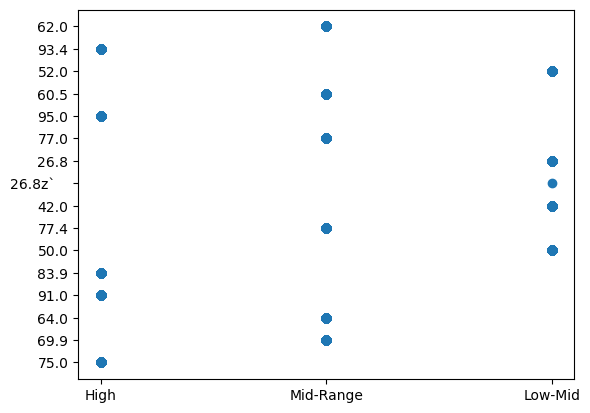

In [34]:
x = customers['income_tier']
y = customers['battery_capacity_kwh']

plt.scatter(x, y)

# EDA

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sessions_cols = [
    "session_id","customer_id","station_id","session_start_time","kwh_charged",
    "cost_per_kwh","total_cost"
]

stations_cols = [
    "station_id","district_name","income_tier","operator_name","plugs_count","latitude","longitude"
]

customers_cols = [
    "customer_id","income_tier","car_model","battery_capacity_kwh"
]

districts_cols = [
    "district_name","income_tier","projected_evs","projected_plugs","projected_regular_customers"
]



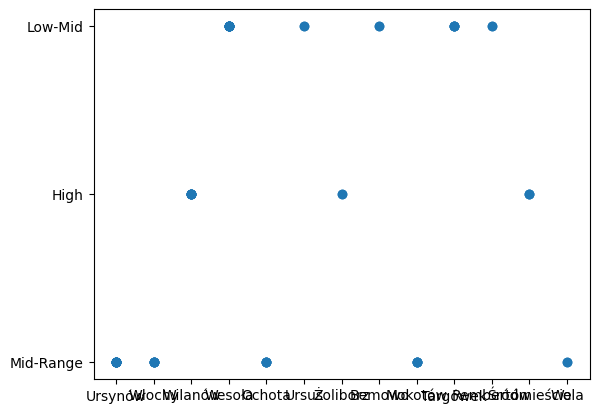

In [36]:
plt.scatter(stations['district_name'], stations['income_tier'])

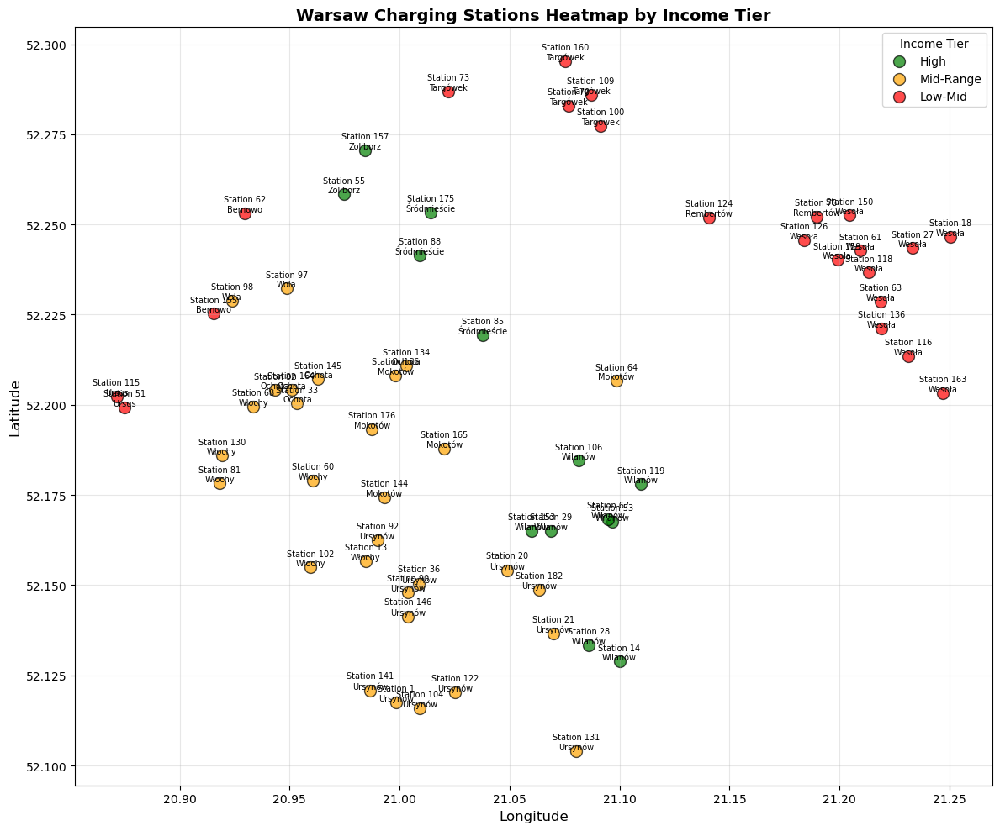

In [43]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
{
    'High': 'green',
    'Mid-Range': 'orange', 
    'Low-Mid': 'red'
}
plt.figure(figsize=(12, 10))
for income_tier in ['High', 'Mid-Range', 'Low-Mid']:
    tier_stations = stations[stations['income_tier'] == income_tier]
    plt.scatter(
        tier_stations['longitude'], 
        tier_stations['latitude'],
        c=income_tier_colors[income_tier],
        label=income_tier,
        s=100,
        alpha=0.7,
        edgecolors='black',
        linewidth=1
    )
for idx, row in stations.iterrows():
    plt.annotate(
        f"Station {row['station_id']}\n{row['district_name']}",
        (row['longitude'], row['latitude']),
        fontsize=7,
        ha='center',
        va='bottom'
    )

plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.title('Warsaw Charging Stations Heatmap by Income Tier', fontsize=14, fontweight='bold')
plt.legend(title='Income Tier', fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [50]:
import folium
from branca.element import Element 
warsaw_center = [52.2297, 21.0122]
m = folium.Map(location=warsaw_center, zoom_start=12)
tier_colors = {
    'Low-Mid': 'blue',
    'Mid-Range': 'green',
    'High': 'red'
}
for _, row in stations.iterrows():
    lat, lon = row['latitude'], row['longitude']
    tier = row['income_tier']
    color = tier_colors.get(tier, 'gray')  # gray if not found
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=6,               # size of point
        color=color,            # outline color
        fill=True,
        fill_color=color,       # inside color
        fill_opacity=0.7,
        popup=f"Income Tier: {tier}"
    ).add_to(m)
    from branca.element import Template, MacroElement

legend_html = """
<div style="
    position: fixed; 
    bottom: 40px; left: 40px; width: 150px; height: 110px; 
    border:2px solid grey; z-index:9999; font-size:14px;
    background-color:white; padding:10px; border-radius:8px;">
    <b>Income Tier</b><br>
    <i style="background:blue; width:10px; height:10px; float:left; margin-right:8px;"></i> Low<br>
    <i style="background:green; width:10px; height:10px; float:left; margin-right:8px;"></i> Medium<br>
    <i style="background:red; width:10px; height:10px; float:left; margin-right:8px;"></i> High<br>
</div>
"""

legend = Element(legend_html)
m.get_root().html.add_child(legend)

m


Used Folium to push an interactive map of warsaw with color coded income tiers. 